# ECE 285 - Project

Author: Zhongkang Fang

This is an implentation of the paper "UNSUPERVISED REPRESENTATION LEARNING WITH DEEP CONVOLUTIONAL GENERATIVE ADVERSARIAL NETWORKS" by Alec Radford & Luke Metz and Soumith Chintala. 

In [57]:
# importing libraries
import torch
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.nn as nn
import torch.nn.parallel
import torch.utils.data

import torchvision.transforms as transforms
import torchvision.utils as vutils
import torchvision.datasets as dset
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

#### Generatives Adversasrial Networks read in a random noise as input and generate an output like image. 

 - DCGANS consist of a generator network and a discriminator network that compete against each other in a game-like setup. 
 - Generator: takes noise vector as inputs and outputs the image.
 - Discriminator: Classify the images as a real(1) or fake(0).
 - We want the discrimintator to do its best to classify if an image is real or fake, while the generator wants to generate a image that fools the discriminator.
 - Reference open source implementation by Indira Dutta and Srijarko Roy.

### Generator
    - according to the paper use a ReLU activation for generator.
<div>
<img src="dcgan.png" width="600"/>
</div>


In [58]:
class Generator(nn.Module):
    def __init__(self, z, ngf, nc, ngpu):
        super(Generator, self).__init__()
        self.z,self.ngf,self.nc,self.ngpu = z, ngf, nc, ngpu
        
        #input Z going into convolution
        
        self.main = nn.Sequential(
            nn.ConvTranspose2d( self.z, self.ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            #  (ngf*8) x 4 x 4
            nn.ConvTranspose2d(self.ngf * 8, self.ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(self.ngf * 4),
            nn.ReLU(True),
            #  (ngf*4) x 8 x 8
            nn.ConvTranspose2d(self.ngf * 4, self.ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(self.ngf * 2),
            nn.ReLU(True),
            #  (ngf*2) x 16 x 16
            nn.ConvTranspose2d(self.ngf * 2, self.ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(self.ngf),
            nn.ReLU(True),
            #  (ngf) x 32 x 32
            nn.ConvTranspose2d(self.ngf, self.nc, 4, 2, 1, bias=False),
            nn.Tanh()
            #  64 x 64 output
        )

    def forward(self, input):
        return self.main(input)

### Discriminator
    - No pooling, use strided convolution
    - use LeakyRelu activation in all layers
    - batchNormalization in both generator and discriminator (stable)
    

In [59]:
class Discriminator(nn.Module):
    def __init__(self, nc, ndf, ngpu):
        super(Discriminator, self).__init__()
        self.nc, self.ndf, self.ngpu= nc,ndf,ngpu
        
        #down sampling - opposite of generator
        
        self.main = nn.Sequential(
            # 64 x 64 i
            nn.Conv2d(self.nc, self.ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # (ndf) x 32 x 32
            nn.Conv2d(self.ndf, self.ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(self.ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # (ndf*2) x 16 x 16
            nn.Conv2d(self.ndf * 2, self.ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(self.ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # (ndf*4) x 8 x 8
            nn.Conv2d(self.ndf * 4, self.ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(self.ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # (ndf*8) x 4 x 4
            nn.Conv2d(self.ndf * 8, 1, 4, 1, 0, bias=False),
            # single sigmoid activation output (1,0)
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)
    


In [67]:
    def weights_init(init_model):

        '''
        input: an initialized model
        output: reinitialized convolutional, convolutional-transpose, and batch normalization layers 
        '''
        classname = init_model.__class__.__name__
        if classname.find('Conv') != -1:
            nn.init.normal_(init_model.weight.data, 0.0, 0.02)   
        elif classname.find('BatchNorm') != -1:
            nn.init.normal_(init_model.weight.data, 1.0, 0.02)
            nn.init.constant_(init_model.bias.data, 0)
            
    def train(epoch, generator, discriminator, dataloader, lr):
        '''
        Training:

        - adjust G’s objective function to maximize log(D(G(z)))
        - Discriminator Training: update the discriminator by ascending its stochastic gradient, maximize log(D(x))+log(1−D(G(z)))
        - Generator Training: train the Generator by minimizing log(1-D(G(z)))
        '''
        netG, netD, loader = generator, discriminator, dataloader
        loss_G = []
        loss_D = []
        imgList = []
        
        netG.apply(weights_init)
        netD.apply(weights_init)
        
        opt_G = optim.Adam(netG.parameters(), lr=lr, betas=(0.5, 0.999))
        opt_D = optim.Adam(netD.parameters(), lr=lr, betas=(0.5, 0.999))
        
        # loss function: binary cross entropy loss
        loss  = nn.BCELoss()
        # label 
        label_real = 1
        label_fake = 0
        # latent vectors for generatr visualization for progress
        fixed_noise = torch.randn(64, 100, 1, 1, device = device)
        
        for x in range(epoch):
            for y, data in enumerate(loader,0):
                
    
    # -------------------------------------------DISCRIMINATOR-------------------------
                ''' Train Discriminator with real img '''
                ''' Try max:  log(D(x)) + log(1 - D(G(z))) in Discriminator''' 
                netD.zero_grad()
                
                ''' batch of real img'''
                batch = data[0].to(device)
                b_size = batch.size(0)
                
                '''target tensor'''
                label = torch.full((b_size,), label_real, dtype=torch.float, device=device)
                '''pass it to discriminator'''
                output = netD(batch).view(-1)
                '''finding loss and find grad'''
                errorD_real = loss(output, label)
                errorD_real.backward()
                Dx = output.mean().item()
                
                
                '''train discriminator with fake sample, generatate fake img from generator'''
                noise = torch.randn(b_size, 100, 1, 1, device=device)
                fake_batch = netG(noise)
                label.fill_(label_fake)
                output = netD(fake_batch.detach()).view(-1)
                
                ''' discriminator error for fake samples '''
                errorD_fake = loss(output, label)
                
                ''' finding loss and find grad '''
                errorD_fake.backward()
                Dz = output.mean().item()
                errorD = errorD_fake + errorD_real
                
                ''' update discrimintor '''
                opt_D.step()
                
# -------------------------------------------GENERATOR-------------------------
                netG.zero_grad()
                '''target tensor'''
                label.fill_(label_real)
                '''pass it to discriminator'''
                output = netD(fake_batch).view(-1)
                '''generator error, and find grad'''
                errorG = loss(output, label)
                errorG.backward()
                Gz = output.mean().item()
                
                ''' update generator '''
                opt_G.step()
                
                ''' saving the losses from the discriminator and generator '''
                loss_G.append(errorG.item())
                loss_D.append(errorD.item())
                
                if y == (len(loader)-1):
                    with torch.no_grad():
                        fake = netG(fixed_noise).detach().cpu()
                    imgList.append(vutils.make_grid(fake, padding=2, normalize=True))
                
                
                ''' output training steps '''
                if y%50==0:
                    print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f' % (x+1, epoch, y, len(loader), errorD.item(), errorG.item(), Dx, Dz, Gz))

                
        '''saving model'''     
        #torch.save(netD.state_dict(),'Discriminator/Discriminator.pth')
        #torch.save(netG.state_dict(),'Generator/Generator.pth' )      
        return loss_G, loss_D, imgList

In [61]:
LEARING_RATE = 2e-4
BATCH_SIZE = 128
EPOCH = 10

dataset = dset.ImageFolder(root="./dataset", 
                               transform=transforms.Compose([
                                   transforms.Resize(64),
                                   transforms.CenterCrop(64),
                                   transforms.ToTensor(),
                                   transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                               ]))                


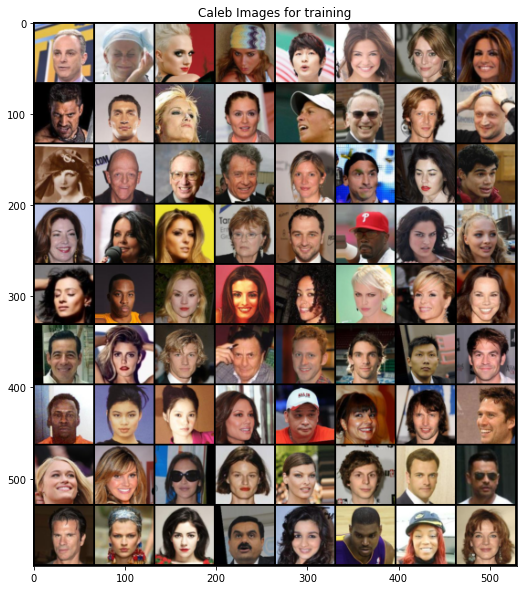

In [62]:
# loader and plot
loader = torch.utils.data.DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
real = next(iter(loader))
plt.figure(figsize=(10,10))
plt.title("Caleb Images for training")
plt.imshow(np.transpose(vutils.make_grid(real[0].to(device)[:72], normalize=True).cpu(),(1,2,0)))

In [70]:
# initialize discrimnator and generator
# noise dim= 100, feature = 64, color channel = 3, GPU = 1
netG = Generator(100,64,3,1).to(device)
#  color channel = 3,  feature = 64, GPU = 1
netD = Discriminator(3, 64,1).to(device)



# def train(epoch = 10, generator, discriminator, dataloader, lr = 2e-4, ):
loss_G, loss_D, imgList = train(EPOCH,netG,netD,loader, LEARING_RATE)

[1/10][0/1583]	Loss_D: 1.5056	Loss_G: 5.4625	D(x): 0.6015	D(G(z)): 0.5382 / 0.0065
[1/10][50/1583]	Loss_D: 0.6465	Loss_G: 19.1417	D(x): 0.9321	D(G(z)): 0.3666 / 0.0000
[1/10][100/1583]	Loss_D: 0.2263	Loss_G: 6.4912	D(x): 0.9474	D(G(z)): 0.1195 / 0.0053
[1/10][150/1583]	Loss_D: 0.5653	Loss_G: 3.4650	D(x): 0.6503	D(G(z)): 0.0319 / 0.0495
[1/10][200/1583]	Loss_D: 0.4705	Loss_G: 6.0097	D(x): 0.8517	D(G(z)): 0.2165 / 0.0051
[1/10][250/1583]	Loss_D: 0.8469	Loss_G: 7.0632	D(x): 0.9103	D(G(z)): 0.4110 / 0.0019
[1/10][300/1583]	Loss_D: 0.4327	Loss_G: 3.5204	D(x): 0.8363	D(G(z)): 0.1864 / 0.0413
[1/10][350/1583]	Loss_D: 0.6192	Loss_G: 2.4156	D(x): 0.7050	D(G(z)): 0.1523 / 0.1162
[1/10][400/1583]	Loss_D: 0.3729	Loss_G: 2.8467	D(x): 0.8104	D(G(z)): 0.0678 / 0.1005
[1/10][450/1583]	Loss_D: 1.6703	Loss_G: 7.5983	D(x): 0.8818	D(G(z)): 0.6462 / 0.0026
[1/10][500/1583]	Loss_D: 0.5578	Loss_G: 6.2662	D(x): 0.8780	D(G(z)): 0.2589 / 0.0036
[1/10][550/1583]	Loss_D: 0.5114	Loss_G: 7.6762	D(x): 0.9615	D(G(z))

[4/10][50/1583]	Loss_D: 1.1890	Loss_G: 1.2035	D(x): 0.3731	D(G(z)): 0.0270 / 0.3584
[4/10][100/1583]	Loss_D: 0.6457	Loss_G: 2.8456	D(x): 0.8060	D(G(z)): 0.3078 / 0.0799
[4/10][150/1583]	Loss_D: 0.6809	Loss_G: 3.0834	D(x): 0.7918	D(G(z)): 0.3106 / 0.0654
[4/10][200/1583]	Loss_D: 0.5838	Loss_G: 3.1534	D(x): 0.9022	D(G(z)): 0.3448 / 0.0590
[4/10][250/1583]	Loss_D: 0.7065	Loss_G: 1.5273	D(x): 0.6321	D(G(z)): 0.1526 / 0.2536
[4/10][300/1583]	Loss_D: 0.6099	Loss_G: 2.1329	D(x): 0.7657	D(G(z)): 0.2207 / 0.1472
[4/10][350/1583]	Loss_D: 0.4918	Loss_G: 2.4606	D(x): 0.7712	D(G(z)): 0.1801 / 0.1046
[4/10][400/1583]	Loss_D: 1.0567	Loss_G: 4.7783	D(x): 0.8454	D(G(z)): 0.5427 / 0.0127
[4/10][450/1583]	Loss_D: 0.4625	Loss_G: 2.8063	D(x): 0.8454	D(G(z)): 0.2322 / 0.0794
[4/10][500/1583]	Loss_D: 0.6789	Loss_G: 1.8981	D(x): 0.6860	D(G(z)): 0.2098 / 0.1926
[4/10][550/1583]	Loss_D: 1.5095	Loss_G: 5.2989	D(x): 0.9737	D(G(z)): 0.7254 / 0.0083
[4/10][600/1583]	Loss_D: 1.5778	Loss_G: 1.3006	D(x): 0.2662	D(G(z)

[7/10][100/1583]	Loss_D: 0.5052	Loss_G: 1.9478	D(x): 0.7241	D(G(z)): 0.1283 / 0.1773
[7/10][150/1583]	Loss_D: 0.3209	Loss_G: 3.1711	D(x): 0.8997	D(G(z)): 0.1749 / 0.0581
[7/10][200/1583]	Loss_D: 0.6479	Loss_G: 3.6286	D(x): 0.8802	D(G(z)): 0.3641 / 0.0374
[7/10][250/1583]	Loss_D: 0.4575	Loss_G: 2.0746	D(x): 0.7553	D(G(z)): 0.1281 / 0.1567
[7/10][300/1583]	Loss_D: 1.0439	Loss_G: 4.8705	D(x): 0.9430	D(G(z)): 0.5631 / 0.0121
[7/10][350/1583]	Loss_D: 0.4036	Loss_G: 3.5437	D(x): 0.9126	D(G(z)): 0.2519 / 0.0367
[7/10][400/1583]	Loss_D: 1.0031	Loss_G: 1.0355	D(x): 0.4558	D(G(z)): 0.0716 / 0.4270
[7/10][450/1583]	Loss_D: 1.0064	Loss_G: 0.8702	D(x): 0.4337	D(G(z)): 0.0348 / 0.4755
[7/10][500/1583]	Loss_D: 0.6396	Loss_G: 3.1674	D(x): 0.9298	D(G(z)): 0.3783 / 0.0562
[7/10][550/1583]	Loss_D: 0.4475	Loss_G: 2.6466	D(x): 0.7977	D(G(z)): 0.1714 / 0.0882
[7/10][600/1583]	Loss_D: 0.5091	Loss_G: 3.3289	D(x): 0.8992	D(G(z)): 0.3003 / 0.0438
[7/10][650/1583]	Loss_D: 2.9129	Loss_G: 5.1717	D(x): 0.9790	D(G(z

[10/10][150/1583]	Loss_D: 0.7582	Loss_G: 6.5386	D(x): 0.9923	D(G(z)): 0.4770 / 0.0023
[10/10][200/1583]	Loss_D: 1.9512	Loss_G: 0.0299	D(x): 0.2171	D(G(z)): 0.0133 / 0.9711
[10/10][250/1583]	Loss_D: 0.3162	Loss_G: 3.8512	D(x): 0.9119	D(G(z)): 0.1794 / 0.0313
[10/10][300/1583]	Loss_D: 0.9565	Loss_G: 0.5924	D(x): 0.4586	D(G(z)): 0.0268 / 0.6158
[10/10][350/1583]	Loss_D: 0.3211	Loss_G: 3.5002	D(x): 0.8940	D(G(z)): 0.1681 / 0.0435
[10/10][400/1583]	Loss_D: 0.2984	Loss_G: 3.0288	D(x): 0.8283	D(G(z)): 0.0759 / 0.0714
[10/10][450/1583]	Loss_D: 0.3656	Loss_G: 3.4635	D(x): 0.8638	D(G(z)): 0.1707 / 0.0468
[10/10][500/1583]	Loss_D: 0.4278	Loss_G: 3.9642	D(x): 0.9779	D(G(z)): 0.2899 / 0.0282
[10/10][550/1583]	Loss_D: 0.4367	Loss_G: 3.1804	D(x): 0.8429	D(G(z)): 0.1900 / 0.0617
[10/10][600/1583]	Loss_D: 0.4078	Loss_G: 1.9084	D(x): 0.7467	D(G(z)): 0.0646 / 0.2083
[10/10][650/1583]	Loss_D: 0.9118	Loss_G: 1.2568	D(x): 0.4638	D(G(z)): 0.0094 / 0.3511
[10/10][700/1583]	Loss_D: 0.2787	Loss_G: 3.1738	D(x): 

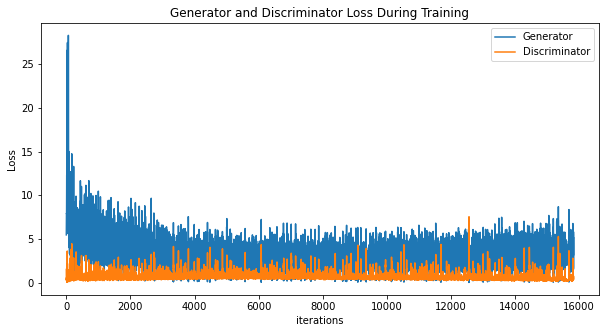

In [71]:

plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(loss_G,label="Generator")
plt.plot(loss_D,label="Discriminator")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

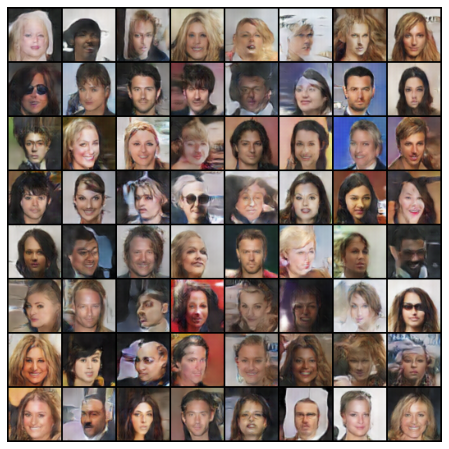

In [72]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in imgList]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

Trying different slope

In [73]:
class Discriminator(nn.Module):
    def __init__(self, nc, ndf, ngpu):
        super(Discriminator, self).__init__()
        self.nc, self.ndf, self.ngpu= nc,ndf,ngpu
        
        #down sampling - opposite of generator
        
        self.main = nn.Sequential(
            # 64 x 64 i
            nn.Conv2d(self.nc, self.ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.1, inplace=True),
            # (ndf) x 32 x 32
            nn.Conv2d(self.ndf, self.ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(self.ndf * 2),
            nn.LeakyReLU(0.1, inplace=True),
            # (ndf*2) x 16 x 16
            nn.Conv2d(self.ndf * 2, self.ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(self.ndf * 4),
            nn.LeakyReLU(0.1, inplace=True),
            # (ndf*4) x 8 x 8
            nn.Conv2d(self.ndf * 4, self.ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(self.ndf * 8),
            nn.LeakyReLU(0.1, inplace=True),
            # (ndf*8) x 4 x 4
            nn.Conv2d(self.ndf * 8, 1, 4, 1, 0, bias=False),
            # single sigmoid activation output (1,0)
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)
    

In [74]:
# initialize discrimnator and generator
# noise dim= 100, feature = 64, color channel = 3, GPU = 1
netG = Generator(100,64,3,1).to(device)
#  color channel = 3,  feature = 64, GPU = 1
netD = Discriminator(3, 64,1).to(device)



# def train(epoch = 10, generator, discriminator, dataloader, lr = 2e-4, ):
loss_G, loss_D, imgList = train(EPOCH,netG,netD,loader, LEARING_RATE)

[1/10][0/1583]	Loss_D: 1.5185	Loss_G: 2.7634	D(x): 0.4150	D(G(z)): 0.3507 / 0.0800
[1/10][50/1583]	Loss_D: 0.1666	Loss_G: 30.6639	D(x): 0.9175	D(G(z)): 0.0000 / 0.0000
[1/10][100/1583]	Loss_D: 0.0002	Loss_G: 34.1400	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[1/10][150/1583]	Loss_D: 0.3460	Loss_G: 4.8288	D(x): 0.9131	D(G(z)): 0.1788 / 0.0144
[1/10][200/1583]	Loss_D: 0.6909	Loss_G: 5.4279	D(x): 0.7568	D(G(z)): 0.2271 / 0.0108
[1/10][250/1583]	Loss_D: 1.2273	Loss_G: 8.0866	D(x): 0.9008	D(G(z)): 0.6017 / 0.0010
[1/10][300/1583]	Loss_D: 0.7363	Loss_G: 6.7640	D(x): 0.8887	D(G(z)): 0.4010 / 0.0048
[1/10][350/1583]	Loss_D: 0.6405	Loss_G: 4.8617	D(x): 0.6267	D(G(z)): 0.0094 / 0.0245
[1/10][400/1583]	Loss_D: 0.4438	Loss_G: 4.6034	D(x): 0.8796	D(G(z)): 0.2238 / 0.0184
[1/10][450/1583]	Loss_D: 0.5289	Loss_G: 5.5195	D(x): 0.8763	D(G(z)): 0.2702 / 0.0080
[1/10][500/1583]	Loss_D: 0.5243	Loss_G: 4.7831	D(x): 0.8589	D(G(z)): 0.2078 / 0.0162
[1/10][550/1583]	Loss_D: 0.7505	Loss_G: 1.9233	D(x): 0.6036	D(G(z)

[4/10][50/1583]	Loss_D: 0.5040	Loss_G: 2.0880	D(x): 0.7140	D(G(z)): 0.1146 / 0.1673
[4/10][100/1583]	Loss_D: 0.5136	Loss_G: 1.8875	D(x): 0.7367	D(G(z)): 0.1451 / 0.1893
[4/10][150/1583]	Loss_D: 0.4302	Loss_G: 2.4496	D(x): 0.7554	D(G(z)): 0.1136 / 0.1102
[4/10][200/1583]	Loss_D: 1.0419	Loss_G: 3.8602	D(x): 0.7995	D(G(z)): 0.5003 / 0.0344
[4/10][250/1583]	Loss_D: 0.7473	Loss_G: 3.3843	D(x): 0.8031	D(G(z)): 0.3538 / 0.0497
[4/10][300/1583]	Loss_D: 0.9716	Loss_G: 0.4713	D(x): 0.5312	D(G(z)): 0.1866 / 0.6569
[4/10][350/1583]	Loss_D: 0.6295	Loss_G: 2.3721	D(x): 0.8042	D(G(z)): 0.2878 / 0.1223
[4/10][400/1583]	Loss_D: 0.3254	Loss_G: 3.0367	D(x): 0.8237	D(G(z)): 0.0968 / 0.0667
[4/10][450/1583]	Loss_D: 0.6200	Loss_G: 1.4816	D(x): 0.6727	D(G(z)): 0.1493 / 0.2734
[4/10][500/1583]	Loss_D: 0.5166	Loss_G: 2.5055	D(x): 0.8136	D(G(z)): 0.2373 / 0.0997
[4/10][550/1583]	Loss_D: 1.1385	Loss_G: 0.5536	D(x): 0.4327	D(G(z)): 0.0614 / 0.6291
[4/10][600/1583]	Loss_D: 0.7461	Loss_G: 1.1656	D(x): 0.6228	D(G(z)

[7/10][100/1583]	Loss_D: 2.0427	Loss_G: 4.8337	D(x): 0.9571	D(G(z)): 0.7927 / 0.0177
[7/10][150/1583]	Loss_D: 0.2933	Loss_G: 2.8307	D(x): 0.8713	D(G(z)): 0.1266 / 0.0848
[7/10][200/1583]	Loss_D: 0.2547	Loss_G: 3.2528	D(x): 0.9491	D(G(z)): 0.1645 / 0.0575
[7/10][250/1583]	Loss_D: 1.1533	Loss_G: 2.3797	D(x): 0.7618	D(G(z)): 0.4905 / 0.1396
[7/10][300/1583]	Loss_D: 0.3740	Loss_G: 3.2512	D(x): 0.8822	D(G(z)): 0.1948 / 0.0544
[7/10][350/1583]	Loss_D: 0.4184	Loss_G: 3.8871	D(x): 0.9010	D(G(z)): 0.2286 / 0.0306
[7/10][400/1583]	Loss_D: 0.7972	Loss_G: 5.1648	D(x): 0.9704	D(G(z)): 0.4612 / 0.0093
[7/10][450/1583]	Loss_D: 0.2782	Loss_G: 2.4049	D(x): 0.8399	D(G(z)): 0.0766 / 0.1233
[7/10][500/1583]	Loss_D: 0.8728	Loss_G: 0.8912	D(x): 0.5211	D(G(z)): 0.0440 / 0.4949
[7/10][550/1583]	Loss_D: 0.5637	Loss_G: 3.9530	D(x): 0.8710	D(G(z)): 0.2945 / 0.0311
[7/10][600/1583]	Loss_D: 0.3323	Loss_G: 3.3081	D(x): 0.9114	D(G(z)): 0.1919 / 0.0525
[7/10][650/1583]	Loss_D: 1.3113	Loss_G: 6.2698	D(x): 0.9613	D(G(z

[10/10][150/1583]	Loss_D: 0.1590	Loss_G: 4.3646	D(x): 0.9640	D(G(z)): 0.1033 / 0.0242
[10/10][200/1583]	Loss_D: 0.1945	Loss_G: 4.1207	D(x): 0.9655	D(G(z)): 0.1285 / 0.0239
[10/10][250/1583]	Loss_D: 0.2800	Loss_G: 5.2579	D(x): 0.9503	D(G(z)): 0.1725 / 0.0083
[10/10][300/1583]	Loss_D: 1.4283	Loss_G: 8.5615	D(x): 0.9940	D(G(z)): 0.6626 / 0.0004
[10/10][350/1583]	Loss_D: 0.2845	Loss_G: 2.0932	D(x): 0.8136	D(G(z)): 0.0539 / 0.1737
[10/10][400/1583]	Loss_D: 0.1824	Loss_G: 4.0657	D(x): 0.9497	D(G(z)): 0.1113 / 0.0281
[10/10][450/1583]	Loss_D: 0.2604	Loss_G: 5.2633	D(x): 0.9688	D(G(z)): 0.1786 / 0.0086
[10/10][500/1583]	Loss_D: 0.3535	Loss_G: 1.8912	D(x): 0.7669	D(G(z)): 0.0426 / 0.2214
[10/10][550/1583]	Loss_D: 0.1948	Loss_G: 2.8120	D(x): 0.8833	D(G(z)): 0.0466 / 0.0969
[10/10][600/1583]	Loss_D: 0.6905	Loss_G: 5.1085	D(x): 0.9771	D(G(z)): 0.4058 / 0.0124
[10/10][650/1583]	Loss_D: 0.4004	Loss_G: 2.4375	D(x): 0.8810	D(G(z)): 0.1998 / 0.1309
[10/10][700/1583]	Loss_D: 0.6157	Loss_G: 5.2485	D(x): 

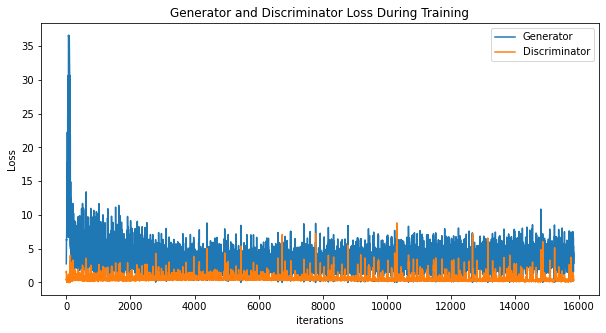

In [75]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(loss_G,label="Generator")
plt.plot(loss_D,label="Discriminator")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

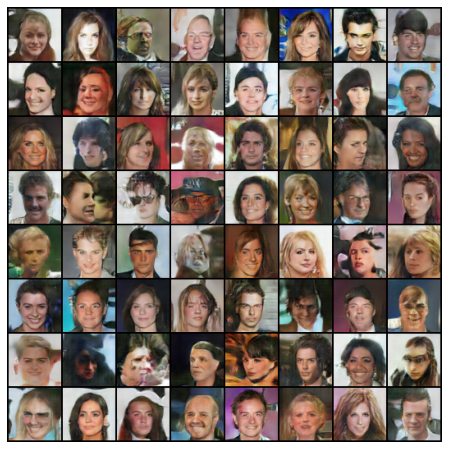

In [76]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in imgList]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())